# Efficient Graph Algorithms

## Formal Definition of a Graph

### Path-Graph
$$ P_n = (V,E) = ( \{ v_1,v_2,\dots,v_n \},\{e_1,e_2,\dots,e_{n-1}\} )$$
$$\forall i: 1 \leq i \leq n - 1 : \; e_i = v_i v_{i+1}   $$

### Circle-Graph
$$ C = (V,E) = ( \{ v_1,v_2,\dots,v_n \},\{e_1,e_2,\dots,e_{n}\} )$$
$$ \forall i: 1 \leq i \leq n - 1 : \; e_i = v_i v_{i+1}$$
$$e_n = v_n v_1$$

### weighted
$$ c: E \rightarrow \mathbb{R}$$

### unweighted
$$ \forall e \in E: c(e) = 1 $$

### undirected
$$ G = (V, E), V = \{ v_1,v_2,\dots,v_n \}, E \subseteq {V \choose 2} $$

#### Complete Graph
$$G = (V,  {V \choose 2})$$ 

### Isomorphie




## Implemation of a Graph

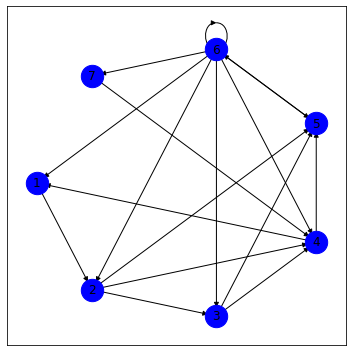

In [1]:
import networkx as nx
import matplotlib.pyplot as plt


MODES = ['Bipartite', 'Spring','Shell']
plt.rcParams['figure.figsize'] = [5, 5]

class Graph:
    def __init__(self, adj_list):
        self.adj_list = adj_list
        self.vertices = adj_list.keys()
        self.edges = [(v,w) for v in self.vertices for w in adj_list[v]]
                                     
                                     
                                    
    @staticmethod                            
    def draw(edges, layout=nx.circular_layout, scale_h=5,with_arrows=False, hypercube=True):
        if not isinstance(layout,list):
            G = nx.DiGraph()
            G.add_edges_from(edges)

            plt.rcParams['figure.figsize'] = [min(15,scale_h), scale_h]
            pos = nx.bipartite_layout(G,[node for node in G if sum([int(c) for c in node]) % 2]) if layout == nx.bipartite_layout and hypercube else layout(G)
            nx.draw_networkx_nodes(G, pos, cmap=plt.get_cmap('jet'), node_color= ['red' if sum([int(c) for c in node]) % 2 else 'blue' for node in G] if hypercube else ['blue'], node_size = 500)
            nx.draw_networkx_labels(G, pos)
            nx.draw_networkx_edges(G, pos, arrows=with_arrows)
            plt.tight_layout()
            
        else:
            size = len(layout)
            plt.rcParams['figure.figsize'] = [size*5, scale_h]
            for i,l in enumerate(layout):
                plt.subplot(1,size,i+1)
                plt.title(MODES[i], color='green')
                G = nx.DiGraph()
                G.add_edges_from(edges)

                
                pos = nx.bipartite_layout(G,[node for node in G if sum([int(c) for c in node]) % 2]) if l == nx.bipartite_layout and hypercube else l(G)
                nx.draw_networkx_nodes(G, pos, cmap=plt.get_cmap('jet'), node_color= ['red' if sum([int(c) for c in node]) % 2 else 'blue' for node in G] if hypercube else ['blue'], node_size = 500)
                nx.draw_networkx_labels(G, pos)
                nx.draw_networkx_edges(G, pos, arrows=with_arrows)
                plt.tight_layout()
          
        
        plt.tight_layout()
        plt.show()
        plt.rcParams['figure.figsize'] = [5, 5]
                                      
                                      
# Testing                                     
G = Graph({
    1 : [2],
    2 : [3,4,5],
    3 : [4,5],
    4 : [1,5],
    5 : [6],
    6 : [1,2,3,4,5,6,7],
    7 : [4]
})
Graph.draw(G.edges, layout=nx.shell_layout, with_arrows=True, hypercube=False)

In [2]:
def draw_hypercube(D, modes=[nx.bipartite_layout,nx.spring_layout,nx.shell_layout], scale_h=5):

    adj_list = { (v:=f'{bin(i)[2:].zfill(D)}') :  # Vertex v
        [f'{v[:i]}{str(int(not int(v[i])))}{v[i+1:]}'  # Neighbors N(v)
        for i,_ in enumerate(v)] for i in range(2**D)}


    G = Graph(adj_list)

    Graph.draw(G.edges,layout=modes, scale_h=scale_h) 

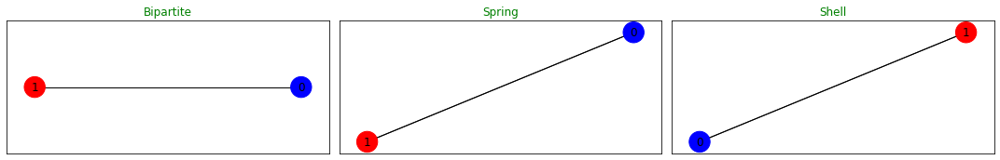

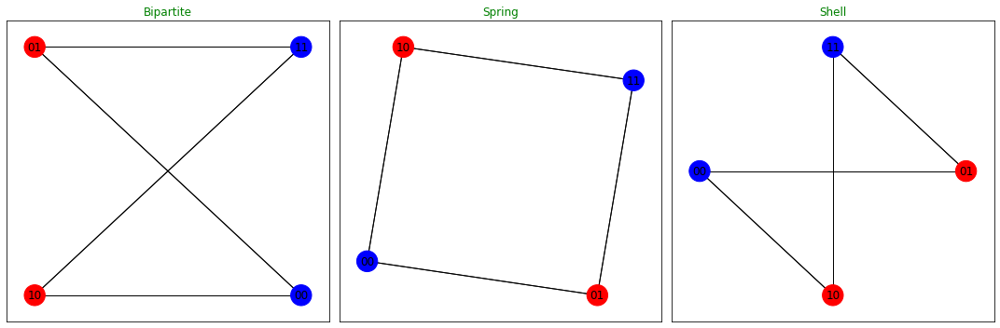

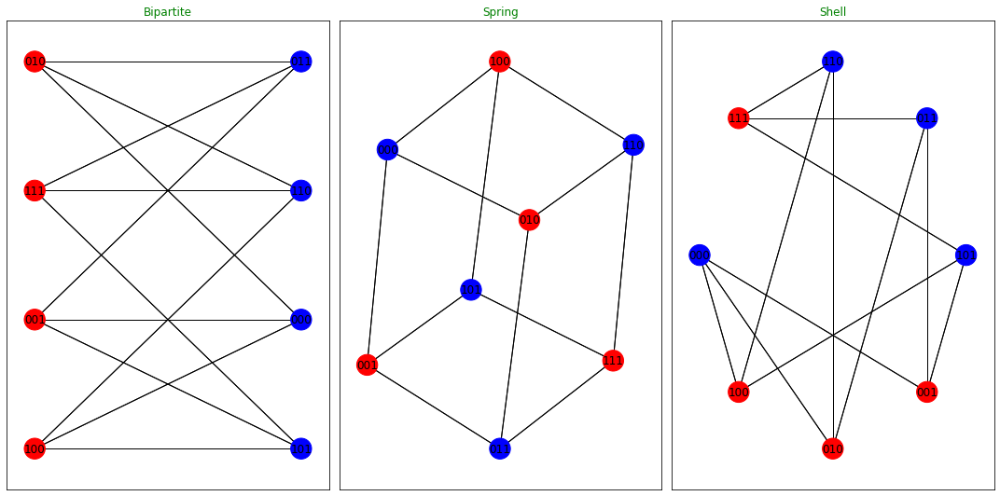

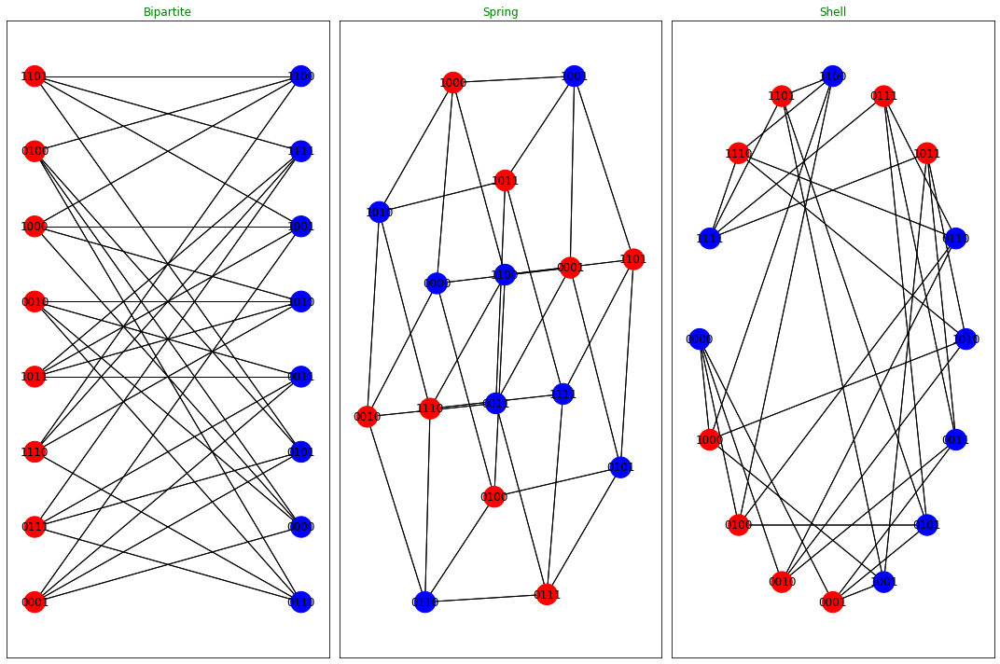

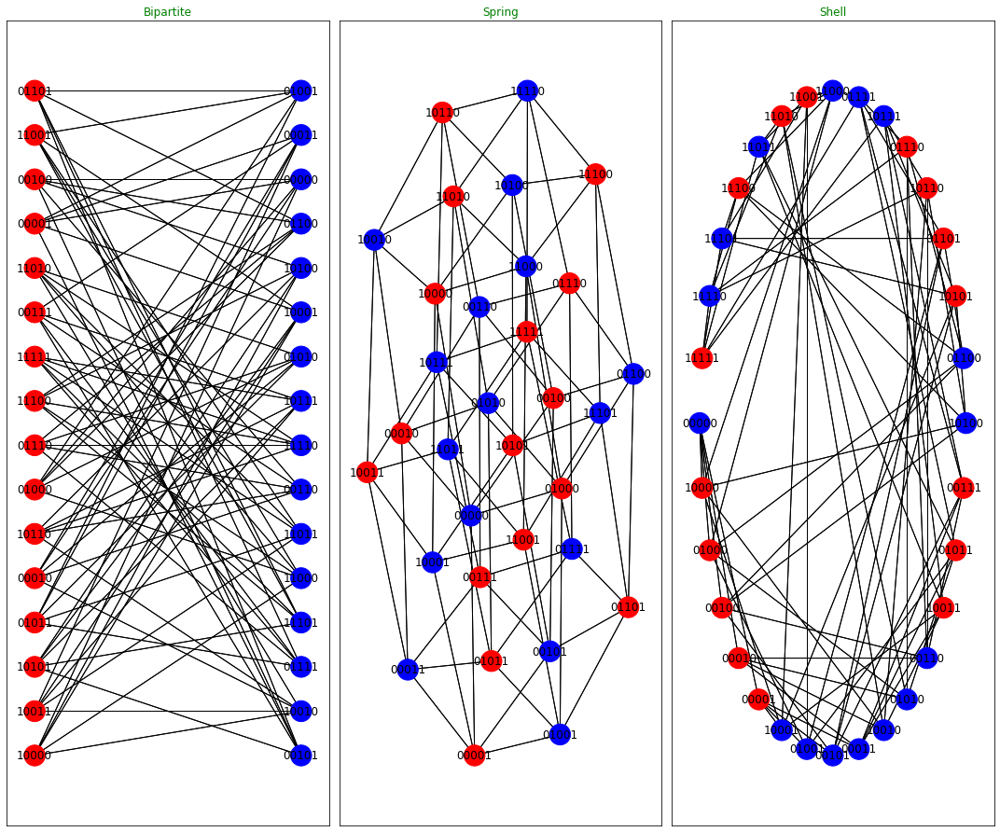

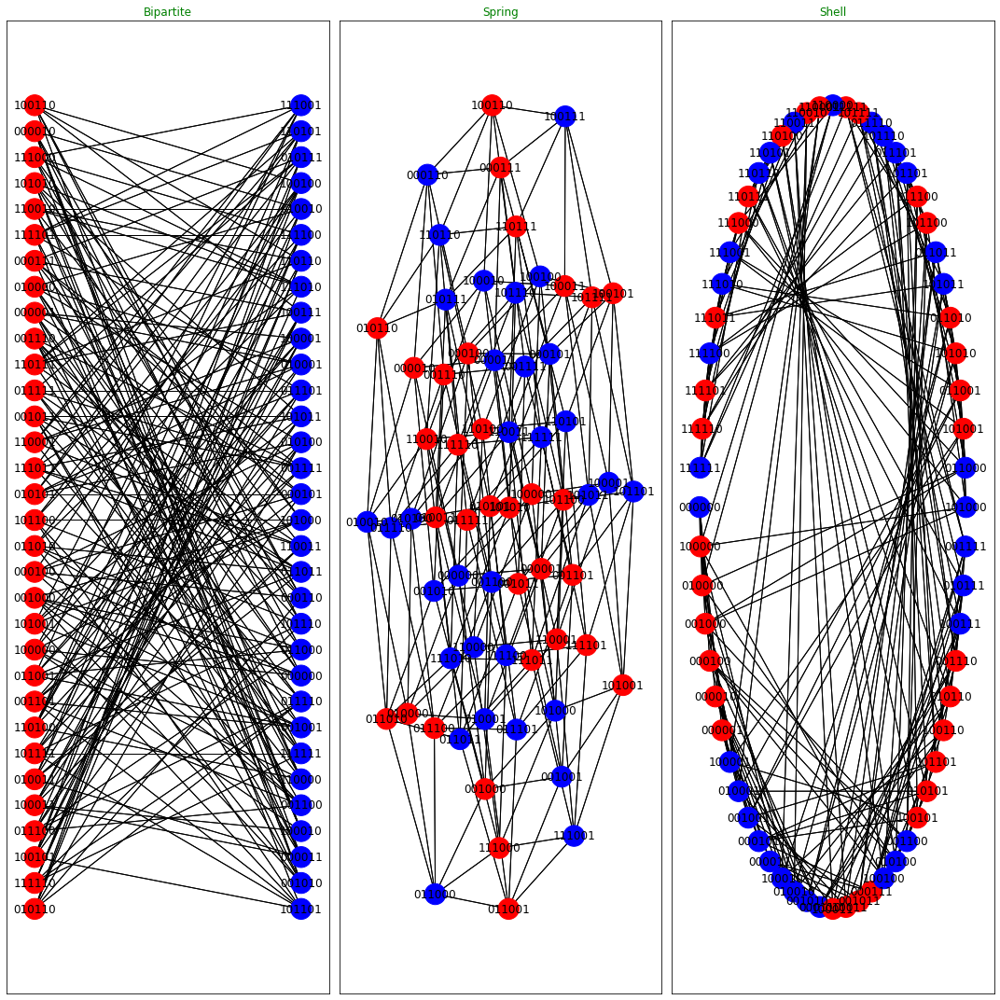

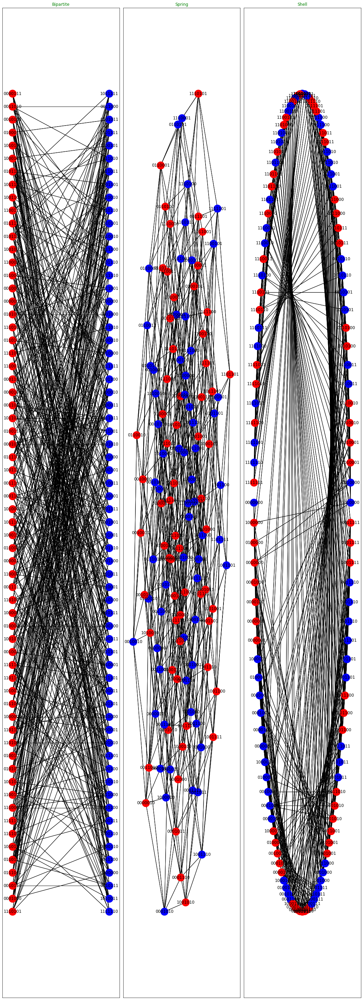

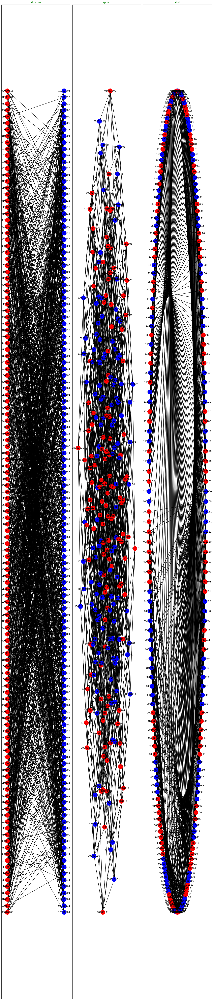

In [345]:
for D in range(1,9):  # Dont go higher than 6 because visual and 10 because complexity
    draw_hypercube(D, scale_h= 2.5*D if D < 7 else 1.7**D)